In [92]:
import pandas as pd
import os
import numpy
import seaborn as sns
import random
import matplotlib.pyplot as plt
#importar dados
os.chdir(r"C:\Users\Utilizador\Desktop\Eiacd\assignment2")
hcc=pd.read_csv("hcc_dataset.csv",sep=",")

In [93]:
hcc.shape
#(linhas,colunas)

(165, 50)

In [94]:
hcc.columns
#nomes das colunas

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class'],
      dtype='object')

In [95]:
#trocar ? por valor NAN
hcc = hcc.replace('?', float('NaN'))
hcc['TP'] = hcc['TP'].astype(float)
m=(['Grams_day', 'Packs_year', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin'])
#passar as colunas com números para flutuantes
hcc[m] = hcc[m].astype(float)
hcc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 50 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Gender          165 non-null    object 
 1   Symptoms        147 non-null    object 
 2   Alcohol         165 non-null    object 
 3   HBsAg           148 non-null    object 
 4   HBeAg           126 non-null    object 
 5   HBcAb           141 non-null    object 
 6   HCVAb           156 non-null    object 
 7   Cirrhosis       165 non-null    object 
 8   Endemic         126 non-null    object 
 9   Smoking         124 non-null    object 
 10  Diabetes        162 non-null    object 
 11  Obesity         155 non-null    object 
 12  Hemochro        142 non-null    object 
 13  AHT             162 non-null    object 
 14  CRI             163 non-null    object 
 15  HIV             151 non-null    object 
 16  NASH            143 non-null    object 
 17  Varices         113 non-null    obj

In [96]:
hcc.dtypes
#tipos de dados em cada coluna

Gender             object
Symptoms           object
Alcohol            object
HBsAg              object
HBeAg              object
HBcAb              object
HCVAb              object
Cirrhosis          object
Endemic            object
Smoking            object
Diabetes           object
Obesity            object
Hemochro           object
AHT                object
CRI                object
HIV                object
NASH               object
Varices            object
Spleno             object
PHT                object
PVT                object
Metastasis         object
Hallmark           object
Age                 int64
Grams_day         float64
Packs_year        float64
PS                 object
Encephalopathy     object
Ascites            object
INR               float64
AFP               float64
Hemoglobin        float64
MCV               float64
Leucocytes        float64
Platelets         float64
 Albumin          float64
Total_Bil         float64
ALT               float64
AST         

In [97]:
hcc.head()

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,...,150.0,7.1,0.70,1.0,3.5,0.5,NaN,NaN,NaN,Lives
1,Female,NaN,No,No,No,No,Yes,Yes,NaN,NaN,...,NaN,NaN,NaN,1.0,1.8,NaN,NaN,NaN,NaN,Lives
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,...,109.0,7.0,2.10,5.0,13.0,0.1,28.0,6.0,16.0,Lives
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,...,174.0,8.1,1.11,2.0,15.7,0.2,NaN,NaN,NaN,Dies
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,...,109.0,6.9,1.80,1.0,9.0,NaN,59.0,15.0,22.0,Lives


In [98]:
hcc.describe()
#decriçao dos dados do DataFrame

,Age,Grams_day,Packs_year,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,...,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin
count,165.000000,117.000000,112.000000,161.000000,1.570000e+02,162.000000,162.000000,162.000000,162.000000,159.000000,...,162.000000,162.000000,154.000000,158.000000,163.000000,145.000000,121.000000,86.000000,85.000000,85.000000
mean,64.690909,71.008547,20.464286,1.421851,1.929995e+04,12.879012,95.119753,1473.961549,113206.442654,3.445535,...,268.026543,212.211605,8.961039,1.127089,2.736196,6.851172,1.930000,85.598837,37.028941,438.997647
std,13.319534,76.277680,51.565130,0.477816,1.490983e+05,2.145237,8.405846,2909.106006,107118.632481,0.685132,...,258.750319,167.943548,11.728739,0.955856,1.797901,5.095042,4.210452,55.698995,28.993552,457.114454
min,20.000000,0.000000,0.000000,0.840000,1.200000e+00,5.000000,69.500000,2.200000,1.710000,1.900000,...,23.000000,1.280000,3.900000,0.200000,0.000000,1.500000,0.100000,0.000000,0.000000,0.000000
25%,57.000000,0.000000,0.000000,1.170000,5.200000e+00,11.425000,89.775000,5.100000,255.750000,3.000000,...,91.250000,108.250000,6.300000,0.700000,1.000000,3.000000,0.370000,40.500000,16.000000,84.000000
50%,66.000000,75.000000,0.000000,1.300000,3.300000e+01,13.050000,94.950000,7.200000,93000.000000,3.400000,...,179.500000,162.000000,7.050000,0.850000,2.000000,5.000000,0.700000,83.000000,27.000000,295.000000
75%,74.000000,100.000000,30.500000,1.530000,6.150000e+02,14.600000,100.675000,19.525000,171500.000000,4.050000,...,345.250000,261.500000,7.575000,1.100000,5.000000,9.000000,1.400000,118.000000,56.000000,706.000000
max,93.000000,500.000000,510.000000,4.820000,1.810346e+06,18.700000,119.600000,13000.000000,459000.000000,4.900000,...,1575.000000,980.000000,102.000000,7.600000,5.000000,22.000000,29.300000,224.000000,126.000000,2230.000000


In [99]:
hcc.isnull().sum()
#numero de valores nulos em cada coluna

Gender              0
Symptoms           18
Alcohol             0
HBsAg              17
HBeAg              39
HBcAb              24
HCVAb               9
Cirrhosis           0
Endemic            39
Smoking            41
Diabetes            3
Obesity            10
Hemochro           23
AHT                 3
CRI                 2
HIV                14
NASH               22
Varices            52
Spleno             15
PHT                11
PVT                 3
Metastasis          4
Hallmark            2
Age                 0
Grams_day          48
Packs_year         53
PS                  0
Encephalopathy    143
Ascites           111
INR                 4
AFP                 8
Hemoglobin          3
MCV                 3
Leucocytes          3
Platelets           3
 Albumin            6
Total_Bil           5
ALT                 4
AST                 3
GGT                 3
ALP                 3
TP                 11
Creatinine          7
Nodules             2
Major_Dim          20
Dir_Bil   

In [100]:
#substituir os valores nulos em float pela media da coluna
media = hcc[m].mean()
hcc[m] = hcc[m].fillna(media)
hcc.isnull().sum()

Gender              0
Symptoms           18
Alcohol             0
HBsAg              17
HBeAg              39
HBcAb              24
HCVAb               9
Cirrhosis           0
Endemic            39
Smoking            41
Diabetes            3
Obesity            10
Hemochro           23
AHT                 3
CRI                 2
HIV                14
NASH               22
Varices            52
Spleno             15
PHT                11
PVT                 3
Metastasis          4
Hallmark            2
Age                 0
Grams_day           0
Packs_year          0
PS                  0
Encephalopathy    143
Ascites           111
INR                 0
AFP                 0
Hemoglobin          0
MCV                 0
Leucocytes          0
Platelets           0
 Albumin            0
Total_Bil           0
ALT                 0
AST                 0
GGT                 0
ALP                 0
TP                  0
Creatinine          0
Nodules             0
Major_Dim           0
Dir_Bil   

In [101]:
hcc.Symptoms.value_counts()
#distribuiçao das diferentes categorias na coluna symptoms

Symptoms
Yes    94
No     53
Name: count, dtype: int64

In [102]:
hcc.loc[pd.isna(hcc.Symptoms) != False,"Symptoms"] = "Yes"
hcc.isnull().sum()
#substituir os valores nulos por yes (valor mais recorrente)

Gender              0
Symptoms            0
Alcohol             0
HBsAg              17
HBeAg              39
HBcAb              24
HCVAb               9
Cirrhosis           0
Endemic            39
Smoking            41
Diabetes            3
Obesity            10
Hemochro           23
AHT                 3
CRI                 2
HIV                14
NASH               22
Varices            52
Spleno             15
PHT                11
PVT                 3
Metastasis          4
Hallmark            2
Age                 0
Grams_day           0
Packs_year          0
PS                  0
Encephalopathy    143
Ascites           111
INR                 0
AFP                 0
Hemoglobin          0
MCV                 0
Leucocytes          0
Platelets           0
 Albumin            0
Total_Bil           0
ALT                 0
AST                 0
GGT                 0
ALP                 0
TP                  0
Creatinine          0
Nodules             0
Major_Dim           0
Dir_Bil   

In [103]:
s=(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'PS', 'Encephalopathy', 'Ascites', 'INR', 'Class'])
from sklearn.impute import SimpleImputer
import numpy as np
imputer=SimpleImputer(missing_values = np.nan, strategy ='most_frequent')
imputer = imputer.fit(hcc[s])
hcc[s] = imputer.transform(hcc[s])
hcc.isnull().sum()
#substituir os valores nulos pelo valor mais frequente na coluna

Gender            0
Symptoms          0
Alcohol           0
HBsAg             0
HBeAg             0
HBcAb             0
HCVAb             0
Cirrhosis         0
Endemic           0
Smoking           0
Diabetes          0
Obesity           0
Hemochro          0
AHT               0
CRI               0
HIV               0
NASH              0
Varices           0
Spleno            0
PHT               0
PVT               0
Metastasis        0
Hallmark          0
Age               0
Grams_day         0
Packs_year        0
PS                0
Encephalopathy    0
Ascites           0
INR               0
AFP               0
Hemoglobin        0
MCV               0
Leucocytes        0
Platelets         0
 Albumin          0
Total_Bil         0
ALT               0
AST               0
GGT               0
ALP               0
TP                0
Creatinine        0
Nodules           0
Major_Dim         0
Dir_Bil           0
Iron              0
Sat               0
Ferritin          0
Class             0


In [104]:
hcc.head()

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,...,150.000000,7.100000,0.700000,1.0,3.5,0.50,85.598837,37.028941,438.997647,Lives
1,Female,Yes,No,No,No,No,Yes,Yes,No,Yes,...,212.211605,8.961039,1.127089,1.0,1.8,1.93,85.598837,37.028941,438.997647,Lives
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,...,109.000000,7.000000,2.100000,5.0,13.0,0.10,28.000000,6.000000,16.000000,Lives
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,...,174.000000,8.100000,1.110000,2.0,15.7,0.20,85.598837,37.028941,438.997647,Dies
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,...,109.000000,6.900000,1.800000,1.0,9.0,1.93,59.000000,15.000000,22.000000,Lives


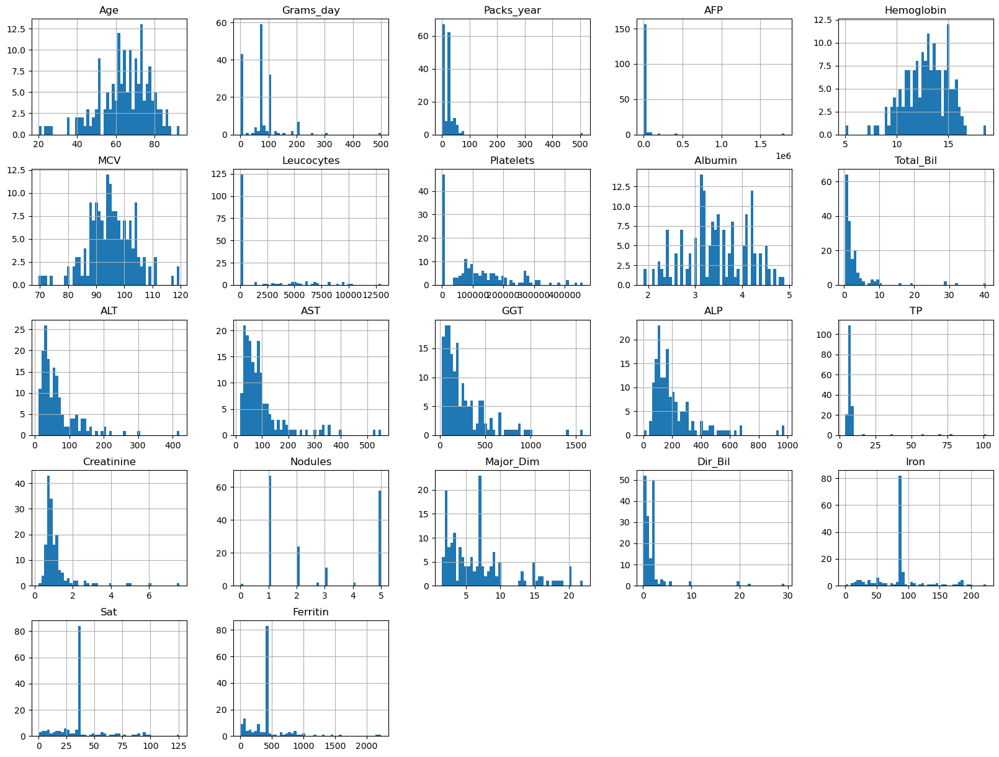

In [105]:
hcc.hist(bins=50, figsize=(20,15))
plt.show()
#distribuiçao dos dados em cada feature

c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to 

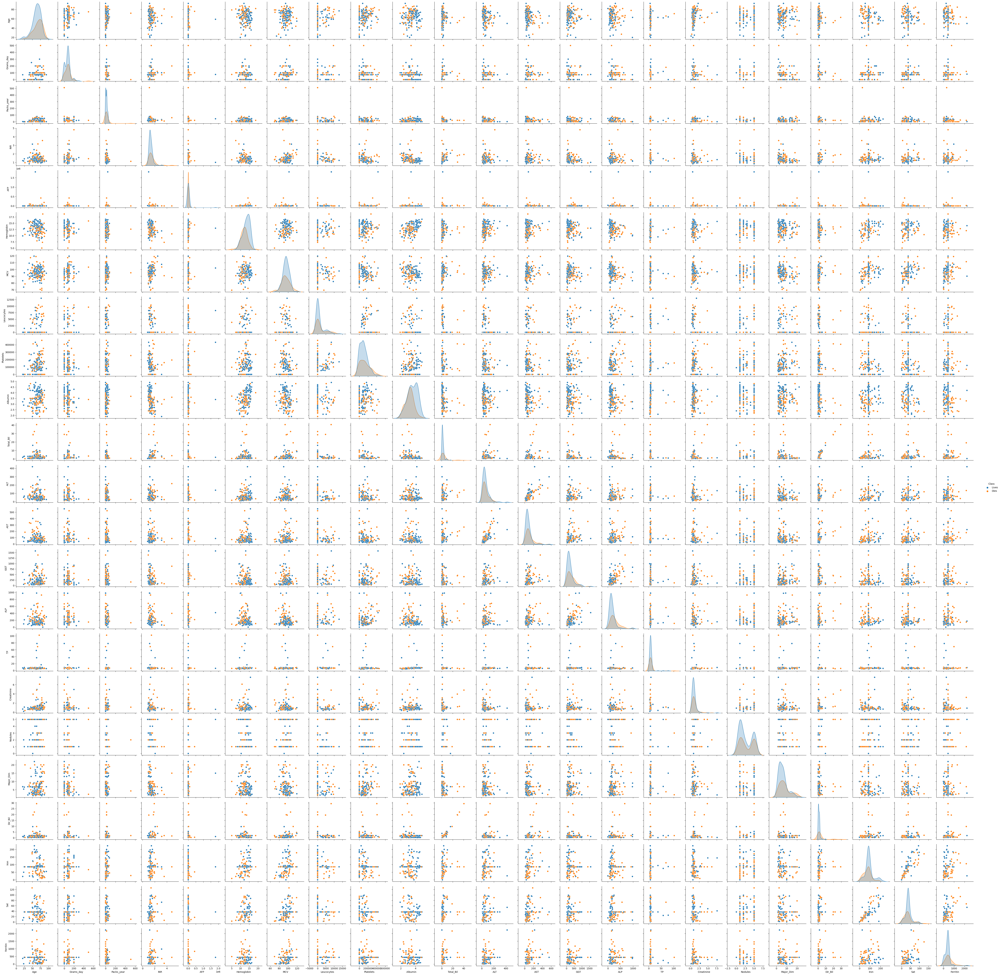

In [106]:
sns.pairplot(hcc.dropna(), hue='Class')
plt.savefig('fig.pdf')
#visualização das relações de todas as features duas a duas

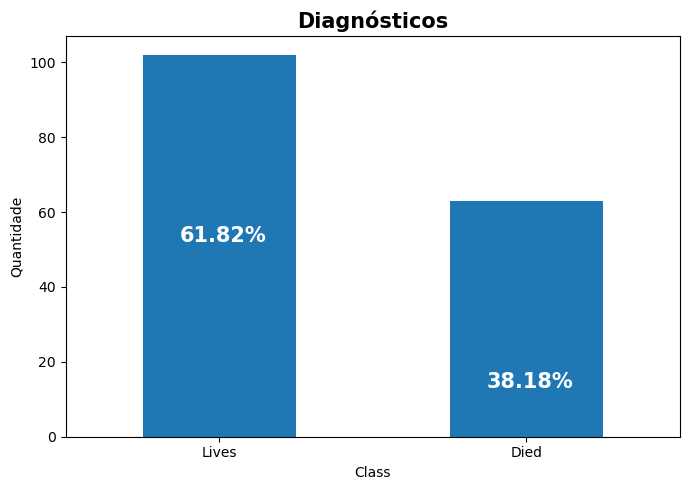

In [107]:
#gráfico com percentagem e o numero de doentes que morreram e viveram um ano após o diagnostico
fig, ax = plt.subplots(figsize = (7,5))
ax = hcc.Class.value_counts().plot(kind = 'bar')
ax.set_title('Diagnósticos', fontsize = 15, loc ='center', weight = 'bold')
ax.set_ylabel('Quantidade')
ax.set_xticklabels(['Lives', 'Died'], rotation = 0)

total = []

for i in ax.patches:
    total.append(i.get_height())

soma = sum(total)

for i in ax.patches:
    ax.text(i.get_x() + .12, i.get_height() - 50,
            str(round((i.get_height()/soma)*100, 2)) + '%',
            fontsize = 15, color = 'white', weight = 'bold')
    
plt.tight_layout()

<Axes: xlabel='Class', ylabel='Age'>

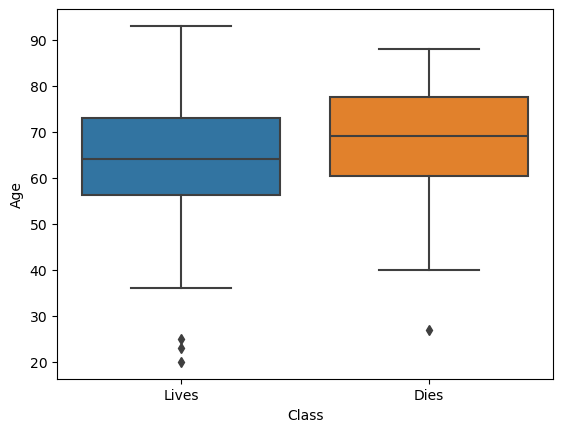

In [108]:
#relação entre a idade do doente e se este viveu ou morreu ao fim de uma ano
sns.boxplot(y="Age",  x = "Class", data = hcc)

In [109]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
hcc["Gender_num"] = enc.fit_transform(hcc.Gender)
hcc.head()
#Encoding Categorical Data para a feature Gender

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class,Gender_num
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,...,7.100000,0.700000,1.0,3.5,0.50,85.598837,37.028941,438.997647,Lives,1
1,Female,Yes,No,No,No,No,Yes,Yes,No,Yes,...,8.961039,1.127089,1.0,1.8,1.93,85.598837,37.028941,438.997647,Lives,0
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,...,7.000000,2.100000,5.0,13.0,0.10,28.000000,6.000000,16.000000,Lives,1
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,...,8.100000,1.110000,2.0,15.7,0.20,85.598837,37.028941,438.997647,Dies,1
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,...,6.900000,1.800000,1.0,9.0,1.93,59.000000,15.000000,22.000000,Lives,1


In [110]:
hcc.value_counts("Gender_num")

Gender_num
1    133
0     32
Name: count, dtype: int64

In [111]:
(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'PS', 'Encephalopathy', 'Ascites', 'INR', 'Class'])
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
hcc["Symptoms_num"] = enc.fit_transform(hcc.Symptoms)
hcc["Alcohol_num"] = enc.fit_transform(hcc.Alcohol)
hcc["HBsAg_num"] = enc.fit_transform(hcc.HBsAg)
hcc["HBeAg_num"] = enc.fit_transform(hcc.HBeAg)
hcc["HBcAb_num"] = enc.fit_transform(hcc.HBcAb)
hcc["HCVAb_num"] = enc.fit_transform(hcc.HCVAb)
hcc["Cirrhosis_num"] = enc.fit_transform(hcc.Cirrhosis)
hcc["Endemic_num"] = enc.fit_transform(hcc.Endemic)
hcc["Smoking_num"] = enc.fit_transform(hcc.Smoking)
hcc["Diabetes_num"] = enc.fit_transform(hcc.Diabetes)
hcc["Obesity_num"] = enc.fit_transform(hcc.Obesity)
hcc["Hemochro_num"] = enc.fit_transform(hcc.Hemochro)
hcc["AHT_num"] = enc.fit_transform(hcc.AHT)
hcc["CRI_num"] = enc.fit_transform(hcc.CRI)
hcc["HIV_num"] = enc.fit_transform(hcc.HIV)
hcc["Nash_num"] = enc.fit_transform(hcc.NASH)
hcc["Varices_num"] = enc.fit_transform(hcc.Varices)
hcc["Spleno_num"] = enc.fit_transform(hcc.Spleno)
hcc["PHT_num"] = enc.fit_transform(hcc.PHT)
hcc["PVT_num"] = enc.fit_transform(hcc.PVT)
hcc["Metastasis_num"] = enc.fit_transform(hcc.Metastasis)
hcc["Hallmark_num"] = enc.fit_transform(hcc.Hallmark)
hcc["PS_num"] = enc.fit_transform(hcc.PS)
hcc["Encephalopathy_num"] = enc.fit_transform(hcc.Encephalopathy)
hcc["Ascites_num"] = enc.fit_transform(hcc.Ascites)
hcc["INR_num"] = enc.fit_transform(hcc.INR)
hcc["Class_num"] = enc.fit_transform(hcc.Class)
#Encoding Categorical Data para as restantes features

In [112]:
hcc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 78 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Gender              165 non-null    object 
 1   Symptoms            165 non-null    object 
 2   Alcohol             165 non-null    object 
 3   HBsAg               165 non-null    object 
 4   HBeAg               165 non-null    object 
 5   HBcAb               165 non-null    object 
 6   HCVAb               165 non-null    object 
 7   Cirrhosis           165 non-null    object 
 8   Endemic             165 non-null    object 
 9   Smoking             165 non-null    object 
 10  Diabetes            165 non-null    object 
 11  Obesity             165 non-null    object 
 12  Hemochro            165 non-null    object 
 13  AHT                 165 non-null    object 
 14  CRI                 165 non-null    object 
 15  HIV                 165 non-null    object 
 16  NASH    

In [113]:
hcc.columns

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class', 'Gender_num', 'Symptoms_num', 'Alcohol_num',
       'HBsAg_num', 'HBeAg_num', 'HBcAb_num', 'HCVAb_num', 'Cirrhosis_num',
       'Endemic_num', 'Smoking_num', 'Diabetes_num', 'Obesity_num',
       'Hemochro_num', 'AHT_num', 'CRI_num', 'HIV_num', 'Nash_num',
       'Varices_num', 'Spleno_num', 'PHT_num', 'PVT_num', 'Metastasis_num',
       'Hallmark_num', 'PS_num', 'Encephalopathy_num', 'Ascites_num',
       'INR_num', 'Class_num'],
     

In [114]:
m=['Age', 'Gender_num', 'Alcohol_num', 'HBsAg_num',
       'HBeAg_num', 'HBcAb_num', 'HCVAb_num', 'Cirrhosis_num', 'Endemic_num',
       'Smoking_num', 'Diabetes_num', 'Obesity_num', 'Hemochro_num', 'AHT_num',
       'CRI_num', 'HIV_num', 'Nash_num', 'Varices_num', 'Spleno_num',
       'PHT_num', 'PVT_num', 'Metastasis_num', 'Hallmark_num', 'PS_num',
       'Encephalopathy_num', 'Ascites_num', 'INR_num', 'Symptoms_num', 'Grams_day', 'Packs_year', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', "Class_num"]
hcc[m].corr()
#mariz de correlação

,Age,Gender_num,Alcohol_num,HBsAg_num,HBeAg_num,HBcAb_num,HCVAb_num,Cirrhosis_num,Endemic_num,Smoking_num,...,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class_num
Age,1.000000,0.172121,0.162934,0.021509,-9.943273e-03,-0.107594,-0.223973,-0.001458,-0.108855,0.016211,...,-0.141881,0.018964,0.190764,-0.058457,8.695688e-02,-1.105806e-01,-0.146420,-0.091996,-0.089366,-0.146054
Gender_num,0.172121,1.000000,0.442103,0.160737,3.830251e-02,0.049867,-0.053286,0.253663,-0.003893,0.322931,...,-0.072613,0.094828,0.051925,-0.139200,-1.766343e-02,9.353285e-02,0.110806,0.106781,0.099634,-0.038435
Alcohol_num,0.162934,0.442103,1.000000,-0.085396,4.635882e-02,-0.068765,-0.141297,0.458652,-0.080658,0.288961,...,-0.073948,-0.100923,-0.020826,0.022632,-1.464060e-01,-6.944264e-02,0.065819,0.093625,0.062141,-0.040302
HBsAg_num,0.021509,0.160737,-0.085396,1.000000,2.382930e-01,0.404490,-0.015037,0.107383,0.345942,0.038828,...,0.032915,-0.048083,0.092996,0.117504,1.414943e-01,1.413419e-01,0.001439,0.008710,0.028698,0.046755
HBeAg_num,-0.009943,0.038303,0.046359,0.238293,1.000000e+00,0.142754,-0.039782,0.025589,-0.019834,0.059803,...,-0.031166,-0.006645,0.176116,-0.076102,-5.740203e-17,1.689747e-01,0.039849,0.113131,0.413235,-0.099359
HBcAb_num,-0.107594,0.049867,-0.068765,0.404490,1.427540e-01,1.000000,0.219573,0.130604,0.102376,-0.028374,...,-0.099876,0.143183,-0.046396,-0.032123,-1.337395e-01,-1.178627e-01,0.190345,0.201455,0.121506,0.074342
HCVAb_num,-0.223973,-0.053286,-0.141297,-0.015037,-3.978157e-02,0.219573,1.000000,0.065673,0.121789,0.048724,...,0.060427,0.053476,0.177032,0.033386,-5.897875e-02,2.378605e-01,0.171669,0.141802,0.145635,-0.093086
Cirrhosis_num,-0.001458,0.253663,0.458652,0.107383,2.558851e-02,0.130604,0.065673,1.000000,-0.088436,0.215738,...,-0.199757,-0.064458,-0.005947,0.115459,-2.918752e-01,4.237974e-02,0.132786,0.141775,0.066624,0.037557
Endemic_num,-0.108855,-0.003893,-0.080658,0.345942,-1.983409e-02,0.102376,0.121789,-0.088436,1.000000,-0.068563,...,0.117417,-0.036769,0.093960,0.194449,1.578944e-01,-4.463609e-02,0.014488,-0.020944,-0.045246,0.095057
Smoking_num,0.016211,0.322931,0.288961,0.038828,5.980346e-02,-0.028374,0.048724,0.215738,-0.068563,1.000000,...,-0.096986,0.044331,-0.066234,-0.062217,6.896316e-03,1.566459e-01,0.071122,0.060045,0.006045,0.044167


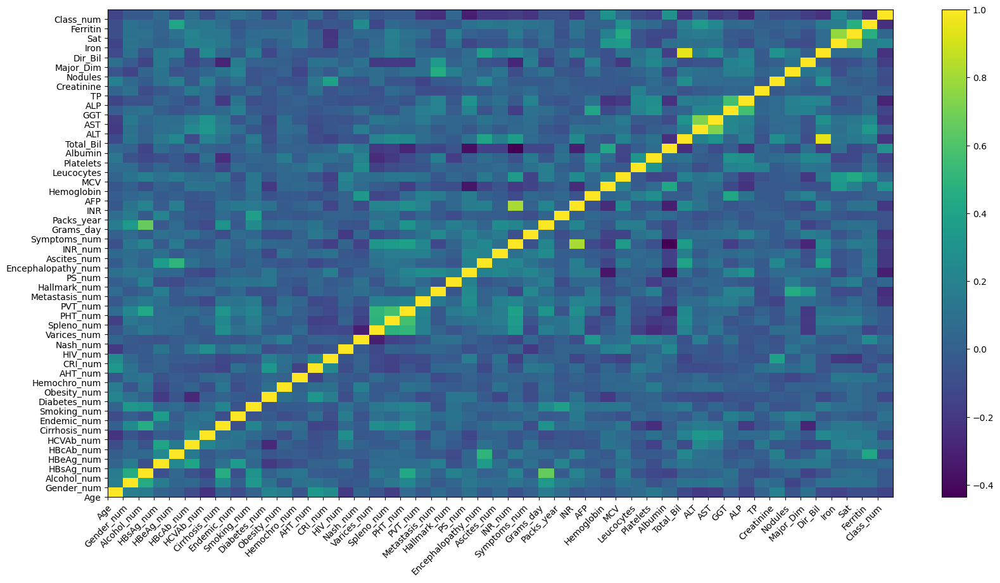

In [115]:
#visualize correlations using heatmap
fig, ax = plt.subplots(figsize = (20,10))
heatmap = plt.pcolor(hcc[m].corr())
cbar = plt.colorbar(heatmap)
# We want to show all labels
ax.set_xticks(np.arange(len(hcc[m].columns)))
ax.set_yticks(np.arange(len(hcc[m].columns)))
ax.set_xticklabels(hcc[m].columns)
ax.set_yticklabels(hcc[m].columns)
# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
plt.show()

In [116]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler 
# fit scaler on training 
hcc[m] = MinMaxScaler().fit_transform(hcc[m])

In [117]:
hcc[m].head()

,Age,Gender_num,Alcohol_num,HBsAg_num,HBeAg_num,HBcAb_num,HCVAb_num,Cirrhosis_num,Endemic_num,Smoking_num,...,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class_num
0,0.643836,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.151954,0.032620,0.067568,0.2,0.097561,0.013699,0.382138,0.293880,0.196860,1.0
1,0.575342,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.215518,0.051591,0.125282,0.2,0.014634,0.062671,0.382138,0.293880,0.196860,1.0
2,0.794521,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.110062,0.031600,0.256757,1.0,0.560976,0.000000,0.125000,0.047619,0.007175,1.0
3,0.780822,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.176475,0.042813,0.122973,0.4,0.692683,0.003425,0.382138,0.293880,0.196860,0.0
4,0.767123,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.110062,0.030581,0.216216,0.2,0.365854,0.062671,0.263393,0.119048,0.009865,1.0


In [118]:
hcc.value_counts("Class_num")

Class_num
1.0    102
0.0     63
Name: count, dtype: int64

In [119]:
hcc[m].corr()["Class_num"].sort_values(ascending=False)
#correlaçao de cada feature com a Class

Class_num             1.000000
Hemoglobin            0.290680
 Albumin              0.283624
Iron                  0.215577
Endemic_num           0.095057
HBcAb_num             0.074342
AHT_num               0.065779
Nash_num              0.061247
HBsAg_num             0.046755
Smoking_num           0.044167
MCV                   0.041833
Cirrhosis_num         0.037557
Sat                   0.031736
Hallmark_num          0.030757
Obesity_num           0.024323
HIV_num               0.013581
AFP                   0.001924
ALT                  -0.005994
Hemochro_num         -0.020256
PHT_num              -0.022568
TP                   -0.028471
Spleno_num           -0.030557
Gender_num           -0.038435
Alcohol_num          -0.040302
Varices_num          -0.050777
Packs_year           -0.072980
Grams_day            -0.074231
Nodules              -0.088368
CRI_num              -0.090343
HCVAb_num            -0.093086
HBeAg_num            -0.099359
Leucocytes           -0.101606
Creatini

In [120]:
m2=['Age', 'Diabetes_num', 'PVT_num', 'Metastasis_num', 'PS_num', 'Encephalopathy_num', 'Ascites_num', 'INR_num', 'Symptoms_num', 'INR', 'Hemoglobin',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'AST', 'GGT', 'ALP', 'Creatinine', 'Major_Dim', 'Dir_Bil', 'Iron', 'Ferritin', 'Class_num']
#seleção das features com maior correlação

c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Utilizador\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to 

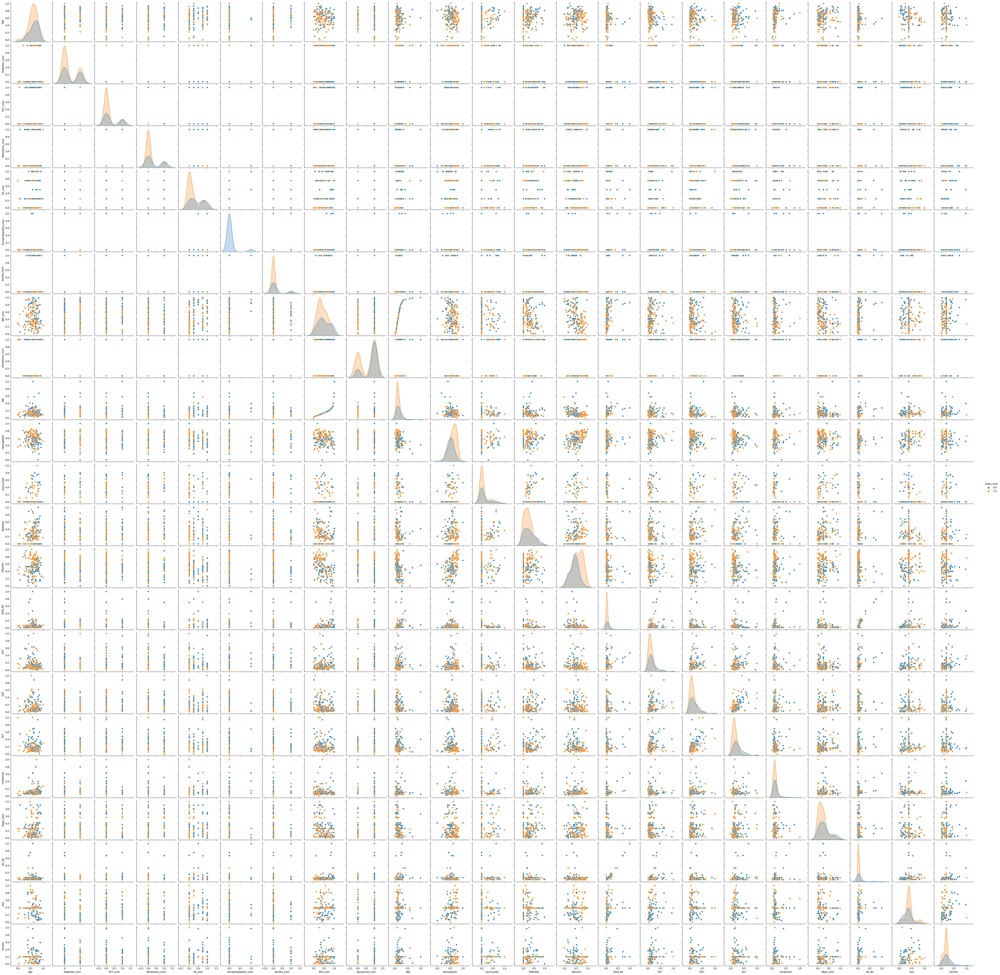

In [121]:
sns.pairplot(hcc[m2], hue='Class_num')

array([[<Axes: xlabel='Age', ylabel='Age'>,
        <Axes: xlabel='Diabetes_num', ylabel='Age'>,
        <Axes: xlabel='PVT_num', ylabel='Age'>,
        <Axes: xlabel='Metastasis_num', ylabel='Age'>,
        <Axes: xlabel='PS_num', ylabel='Age'>,
        <Axes: xlabel='Encephalopathy_num', ylabel='Age'>,
        <Axes: xlabel='Ascites_num', ylabel='Age'>,
        <Axes: xlabel='INR_num', ylabel='Age'>,
        <Axes: xlabel='Symptoms_num', ylabel='Age'>,
        <Axes: xlabel='INR', ylabel='Age'>,
        <Axes: xlabel='Hemoglobin', ylabel='Age'>,
        <Axes: xlabel='Leucocytes', ylabel='Age'>,
        <Axes: xlabel='Platelets', ylabel='Age'>,
        <Axes: xlabel=' Albumin', ylabel='Age'>,
        <Axes: xlabel='Total_Bil', ylabel='Age'>,
        <Axes: xlabel='AST', ylabel='Age'>,
        <Axes: xlabel='GGT', ylabel='Age'>,
        <Axes: xlabel='ALP', ylabel='Age'>,
        <Axes: xlabel='Creatinine', ylabel='Age'>,
        <Axes: xlabel='Major_Dim', ylabel='Age'>,
        <Axes

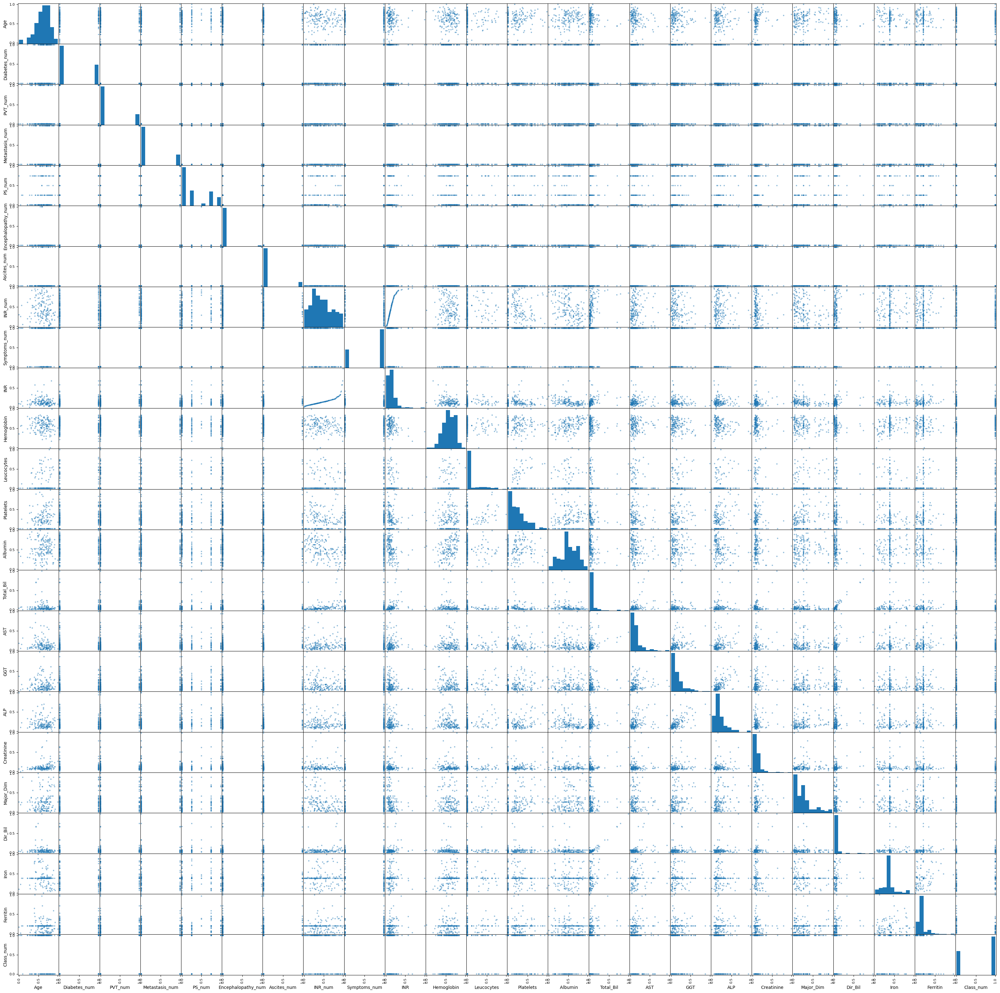

In [122]:
from pandas.plotting import scatter_matrix
scatter_matrix(hcc[m2], figsize=(40,40))

In [123]:
from scipy import stats
hcc1 = hcc[m2]

# Função para detetar outliers usando o método Z-Score
def detect_outliers_zscore(column, threshold=3):
    z_scores = stats.zscore(column)
    return column[abs(z_scores) > threshold]

# Detectar e remover outliers para cada coluna do DataFrame hcc1
for column in hcc1.columns:
    outliers = detect_outliers_zscore(hcc1[column])
    print(f"Outliers detectados na coluna {column}:")
    print(outliers)
    print()
    # Removendo outliers do DataFrame hcc1
    hcc1 = hcc1[~hcc1.index.isin(outliers.index)]

Outliers detectados na coluna Age:
29    0.000000
70    0.041096
Name: Age, dtype: float64

Outliers detectados na coluna Diabetes_num:
Series([], Name: Diabetes_num, dtype: float64)

Outliers detectados na coluna PVT_num:
Series([], Name: PVT_num, dtype: float64)

Outliers detectados na coluna Metastasis_num:
Series([], Name: Metastasis_num, dtype: float64)

Outliers detectados na coluna PS_num:
Series([], Name: PS_num, dtype: float64)

Outliers detectados na coluna Encephalopathy_num:
103    1.0
114    1.0
117    1.0
159    1.0
Name: Encephalopathy_num, dtype: float64

Outliers detectados na coluna Ascites_num:
Series([], Name: Ascites_num, dtype: float64)

Outliers detectados na coluna INR_num:
Series([], Name: INR_num, dtype: float64)

Outliers detectados na coluna Symptoms_num:
Series([], Name: Symptoms_num, dtype: float64)

Outliers detectados na coluna INR:
8     0.577889
23    1.000000
56    0.683417
76    0.582915
Name: INR, dtype: float64

Outliers detectados na coluna Hemogl

In [124]:
hcc1.info

<bound method DataFrame.info of           Age  Diabetes_num  PVT_num  Metastasis_num  PS_num  \
0    0.643836           1.0      0.0             0.0    0.00   
1    0.575342           1.0      0.0             0.0    0.00   
2    0.794521           0.0      0.0             1.0    0.25   
3    0.780822           1.0      0.0             1.0    0.00   
4    0.767123           0.0      0.0             0.0    0.00   
..        ...           ...      ...             ...     ...   
158  0.698630           1.0      0.0             0.0    1.00   
160  0.273973           0.0      0.0             0.0    0.00   
161  0.657534           0.0      0.0             0.0    0.25   
162  0.616438           1.0      0.0             0.0    0.00   
163  0.328767           0.0      1.0             1.0    0.25   

     Encephalopathy_num  Ascites_num   INR_num  Symptoms_num       INR  ...  \
0                   0.0          0.0  0.632184           0.0  0.173367  ...   
1                   0.0          0.0  0.5

In [125]:
hcc[m2].info

<bound method DataFrame.info of           Age  Diabetes_num  PVT_num  Metastasis_num  PS_num  \
0    0.643836           1.0      0.0             0.0    0.00   
1    0.575342           1.0      0.0             0.0    0.00   
2    0.794521           0.0      0.0             1.0    0.25   
3    0.780822           1.0      0.0             1.0    0.00   
4    0.767123           0.0      0.0             0.0    0.00   
..        ...           ...      ...             ...     ...   
160  0.273973           0.0      0.0             0.0    0.00   
161  0.657534           0.0      0.0             0.0    0.25   
162  0.616438           1.0      0.0             0.0    0.00   
163  0.328767           0.0      1.0             1.0    0.25   
164  0.438356           0.0      0.0             1.0    0.00   

     Encephalopathy_num  Ascites_num   INR_num  Symptoms_num       INR  ...  \
0                   0.0          0.0  0.632184           0.0  0.173367  ...   
1                   0.0          0.0  0.5

In [126]:
hcc[m].info

<bound method DataFrame.info of           Age  Gender_num  Alcohol_num  HBsAg_num  HBeAg_num  HBcAb_num  \
0    0.643836         1.0          1.0        0.0        0.0        0.0   
1    0.575342         0.0          0.0        0.0        0.0        0.0   
2    0.794521         1.0          1.0        1.0        0.0        1.0   
3    0.780822         1.0          1.0        0.0        0.0        0.0   
4    0.767123         1.0          1.0        1.0        0.0        1.0   
..        ...         ...          ...        ...        ...        ...   
160  0.273973         0.0          1.0        0.0        0.0        0.0   
161  0.657534         0.0          0.0        0.0        0.0        0.0   
162  0.616438         1.0          1.0        0.0        0.0        0.0   
163  0.328767         1.0          1.0        1.0        0.0        1.0   
164  0.438356         1.0          1.0        0.0        0.0        0.0   

     HCVAb_num  Cirrhosis_num  Endemic_num  Smoking_num  ...       

Modelos de machine learning:
  KNN, 
  Arvore de decisão, 
  Regressão lógica, 
  Random Forest.
Para cada um deles para os seguintes dataframes:
  dataframe com todas as features (hcc[m]),
  dataframe com as features escolhidas a partir da correlação (hcc[m2]),
  dataframe com as features escolhidas a partir da correlação e removidos os outliers (hcc1).
E para cada Dataframe o original e o resultante do imbalanced data technique SMOTE.

In [203]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [204]:
from sklearn.model_selection import train_test_split
SEED = 123
test_size = 0.3
X = hcc[m].iloc[:,0:50]
Y = hcc[m].iloc[:,50]
# create train and test sets
X0_train, X0_test, y0_train, y0_test = train_test_split(X, Y, test_size=test_size, random_state = SEED, stratify=Y)

In [205]:
# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 
smote = SMOTE(sampling_strategy='minority')
X0_train_SMOTE, y0_train_SMOTE = smote.fit_resample(X0_train,y0_train)

In [206]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X0_train, y0_train)
# prediction of the training set
knn_preds_train0 = knn.predict(X0_train)
# calculate the percentage of cases correctly classified
knn_acc_train0 = sum(knn_preds_train0 == y0_train)/ len(y0_train)
# prediction of the test set
knn_preds_test0 = knn.predict(X0_test)
# calculate the percentage of cases correctly classified
knn_acc_test0 = sum(knn_preds_test0 == y0_test)/ len(y0_test)

In [207]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X0_train_SMOTE, y0_train_SMOTE)
# prediction of the training set
knn_preds_train0_smote = knn.predict(X0_train_SMOTE)
# calculate the percentage of cases correctly classified
knn_acc_train0_smote = sum(knn_preds_train0_smote == y0_train_SMOTE)/ len(y0_train_SMOTE)
# prediction of the test set
knn_preds_test0_smote = knn.predict(X0_test)
# calculate the percentage of cases correctly classified
knn_acc_test0_smote = sum(knn_preds_test0_smote == y0_test)/ len(y0_test)

In [208]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X0_train, y0_train)
# prediction o the training set
dt_preds_train0 = dt.predict(X0_train)
# calculate the percentage of cases correctly classified
dt_acc_train0 = sum(dt_preds_train0 == y0_train)/ len(y0_train)
# prediction of the test set
dt_preds_test0 = dt.predict(X0_test)
# calculate the percentage of cases correctly classified
dt_acc_test0 = sum(dt_preds_test0 == y0_test)/ len(y0_test)

In [209]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X0_train_SMOTE, y0_train_SMOTE)
# prediction o the training set
dt_preds_train0_smote = dt.predict(X0_train_SMOTE)
# calculate the percentage of cases correctly classified
dt_acc_train0_smote = sum(dt_preds_train0_smote == y0_train_SMOTE)/ len(y0_train_SMOTE)
# prediction of the test set
dt_preds_test0_smote = dt.predict(X0_test)
# calculate the percentage of cases correctly classified
dt_acc_test0_smote = sum(dt_preds_test0_smote == y0_test)/ len(y0_test)

In [210]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X0_train, y0_train)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train0 = logistic_classifier.predict(X0_train)
# calculate the percentage of cases correctly classified
lr_acc_train0 = sum(lr_preds_train0 == y0_train)/ len(y0_train)
# prediction of the test set
lr_preds_test0 = logistic_classifier.predict(X0_test)
# calculate the percentage of cases correctly classified
lr_acc_test0 = sum(lr_preds_test0 == y0_test)/ len(y0_test)

In [211]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X0_train_SMOTE, y0_train_SMOTE)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train0_smote = logistic_classifier.predict(X0_train_SMOTE)
# calculate the percentage of cases correctly classified
lr_acc_train0_smote = sum(lr_preds_train0_smote == y0_train_SMOTE)/ len(y0_train_SMOTE)
# prediction of the test set
lr_preds_test0_smote = logistic_classifier.predict(X0_test)
# calculate the percentage of cases correctly classified
lr_acc_test0_smote = sum(lr_preds_test0_smote == y0_test)/ len(y0_test)

In [212]:
print ("Decision Tree Train Accuracy: %.3f" % dt_acc_train0)
print ("Decision Tree Test Accuracy: %.3f" % dt_acc_test0)
print ("Decision Tree Train (smote) Accuracy: %.3f" % dt_acc_train0_smote)
print ("Decision Tree Test (smote) Accuracy: %.3f" % dt_acc_test0_smote)
print ("KNN Train Accuracy: %.3f" % knn_acc_train0)
print ("KNN Test Accuracy: %.3f" % knn_acc_test0)
print ("KNN Train (smote) Accuracy: %.3f" % knn_acc_train0_smote)
print ("KNN Test (smote) Accuracy: %.3f" % knn_acc_test0_smote)
print ("LogisticRegression Train Accuracy: %.3f" % lr_acc_train0)
print ("LogisticRegression Test Accuracy: %.3f" % lr_acc_test0)
print ("LogisticRegression Train (smote) Accuracy: %.3f" % lr_acc_train0_smote)
print ("LogisticRegression Test (smote) Accuracy: %.3f" % lr_acc_test0_smote)

Decision Tree Train Accuracy: 0.730
Decision Tree Test Accuracy: 0.680
Decision Tree Train (smote) Accuracy: 0.782
Decision Tree Test (smote) Accuracy: 0.680
KNN Train Accuracy: 0.748
KNN Test Accuracy: 0.680
KNN Train (smote) Accuracy: 0.831
KNN Test (smote) Accuracy: 0.600
LogisticRegression Train Accuracy: 0.835
LogisticRegression Test Accuracy: 0.680
LogisticRegression Train (smote) Accuracy: 0.810
LogisticRegression Test (smote) Accuracy: 0.700


In [213]:
# Better evaluation using Cross-validation
from sklearn.model_selection import cross_val_score
dt_scores = cross_val_score(dt, X, Y, scoring="accuracy", cv = 10)
knn_scores = cross_val_score(knn, X, Y, scoring="accuracy", cv = 10)
lr_scores = cross_val_score(logistic_classifier, X, Y, scoring="accuracy", cv = 10)

In [214]:
print ("Decision Tree Accuracy Avg: %.3f  Std: %.3f" % (dt_scores.mean()*100, dt_scores.std()*100))
print ("KNN Accuracy Avg: %.3f  Std: %.3f" % (knn_scores.mean()*100, knn_scores.std()*100))
print ("lr Accuracy Avg: %.3f  Std: %.3f" % (lr_scores.mean()*100, lr_scores.std()*100))
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
print('\n[Confusion_matrix] DT')
print(confusion_matrix(y0_test, dt_preds_test0))
print('\n[Classification Report test] DT')
print(classification_report(y0_test, dt_preds_test0))

print('\n[Confusion_matrix] KNN')
print(confusion_matrix(y0_test, knn_preds_test0))
print('\n[Classification Report test] KNN')
print(classification_report(y0_test, knn_preds_test0))

print('\n[Confusion_matrix] LR')
print(confusion_matrix(y0_test, lr_preds_test0))
print('\n[Classification Report test] LR')
print(classification_report(y0_test, lr_preds_test0))

print('\n[Confusion_matrix] DT (smote)')
print(confusion_matrix(y0_test, dt_preds_test0_smote))
print('\n[Confusion_matrix] KNN (smote)')
print(confusion_matrix(y0_test, knn_preds_test0_smote))
print('\n[Confusion_matrix] LR (smote)')
print(confusion_matrix(y0_test, lr_preds_test0_smote))

Decision Tree Accuracy Avg: 61.765  Std: 9.454
KNN Accuracy Avg: 65.257  Std: 9.379
lr Accuracy Avg: 70.956  Std: 6.799

[Confusion_matrix] DT
[[ 5 14]
 [ 2 29]]

[Classification Report test] DT
              precision    recall  f1-score   support

         0.0       0.71      0.26      0.38        19
         1.0       0.67      0.94      0.78        31

    accuracy                           0.68        50
   macro avg       0.69      0.60      0.58        50
weighted avg       0.69      0.68      0.63        50


[Confusion_matrix] KNN
[[ 6 13]
 [ 3 28]]

[Classification Report test] KNN
              precision    recall  f1-score   support

         0.0       0.67      0.32      0.43        19
         1.0       0.68      0.90      0.78        31

    accuracy                           0.68        50
   macro avg       0.67      0.61      0.60        50
weighted avg       0.68      0.68      0.65        50


[Confusion_matrix] LR
[[10  9]
 [ 7 24]]

[Classification Report test] LR

In [215]:
from sklearn.model_selection import train_test_split
SEED = 123
test_size = 0.3
X = hcc[m2].iloc[:,0:23]
Y = hcc[m2].iloc[:,23]
# create train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state = SEED, stratify=Y)

In [216]:
# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 
smote = SMOTE(sampling_strategy='minority')
X_train_SMOTE, y_train_SMOTE = smote.fit_resample(X_train,y_train)

In [217]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X_train, y_train)
# prediction of the training set
knn_preds_train = knn.predict(X_train)
# calculate the percentage of cases correctly classified
knn_acc_train = sum(knn_preds_train == y_train)/ len(y_train)
# prediction of the test set
knn_preds_test = knn.predict(X_test)
# calculate the percentage of cases correctly classified
knn_acc_test = sum(knn_preds_test == y_test)/ len(y_test)

In [218]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X_train_SMOTE, y_train_SMOTE)
# prediction of the training set
knn_preds_train_smote = knn.predict(X_train_SMOTE)
# calculate the percentage of cases correctly classified
knn_acc_train_smote = sum(knn_preds_train_smote == y_train_SMOTE)/ len(y_train_SMOTE)
# prediction of the test set
knn_preds_test_smote = knn.predict(X_test)
# calculate the percentage of cases correctly classified
knn_acc_test_smote = sum(knn_preds_test_smote == y_test)/ len(y_test)

In [219]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X_train, y_train)
# prediction o the training set
dt_preds_train = dt.predict(X_train)
# calculate the percentage of cases correctly classified
dt_acc_train = sum(dt_preds_train == y_train)/ len(y_train)
# prediction of the test set
dt_preds_test = dt.predict(X_test)
# calculate the percentage of cases correctly classified
dt_acc_test = sum(dt_preds_test == y_test)/ len(y_test)

In [220]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X_train_SMOTE, y_train_SMOTE)
# prediction o the training set
dt_preds_train_smote = dt.predict(X_train_SMOTE)
# calculate the percentage of cases correctly classified
dt_acc_train_smote = sum(dt_preds_train_smote == y_train_SMOTE)/ len(y_train_SMOTE)
# prediction of the test set
dt_preds_test_smote = dt.predict(X_test)
# calculate the percentage of cases correctly classified
dt_acc_test_smote = sum(dt_preds_test_smote == y_test)/ len(y_test)

In [221]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X_train, y_train)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train = logistic_classifier.predict(X_train)
# calculate the percentage of cases correctly classified
lr_acc_train = sum(lr_preds_train == y_train)/ len(y_train)
# prediction of the test set
lr_preds_test = logistic_classifier.predict(X_test)
# calculate the percentage of cases correctly classified
lr_acc_test = sum(lr_preds_test == y_test)/ len(y_test)

In [222]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X_train_SMOTE, y_train_SMOTE)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train_smote = logistic_classifier.predict(X_train_SMOTE)
# calculate the percentage of cases correctly classified
lr_acc_train_smote = sum(lr_preds_train0_smote == y_train_SMOTE)/ len(y_train_SMOTE)
# prediction of the test set
lr_preds_test_smote = logistic_classifier.predict(X_test)
# calculate the percentage of cases correctly classified
lr_acc_test_smote = sum(lr_preds_test_smote == y_test)/ len(y_test)

In [223]:
print ("Decision Tree Train Accuracy: %.3f" % dt_acc_train)
print ("Decision Tree Test Accuracy: %.3f" % dt_acc_test)
print ("Decision Tree Train (smote) Accuracy: %.3f" % dt_acc_train_smote)
print ("Decision Tree Test (smote) Accuracy: %.3f" % dt_acc_test_smote)
print ("KNN Train Accuracy: %.3f" % knn_acc_train)
print ("KNN Test Accuracy: %.3f" % knn_acc_test)
print ("KNN Train (smote) Accuracy: %.3f" % knn_acc_train_smote)
print ("KNN Test (smote) Accuracy: %.3f" % knn_acc_test_smote)
print ("LogisticRegression Train Accuracy: %.3f" % lr_acc_train)
print ("LogisticRegression Test Accuracy: %.3f" % lr_acc_test)
print ("LogisticRegression Train (smote) Accuracy: %.3f" % lr_acc_train_smote)
print ("LogisticRegression Test (smote) Accuracy: %.3f" % lr_acc_test_smote)

Decision Tree Train Accuracy: 0.730
Decision Tree Test Accuracy: 0.680
Decision Tree Train (smote) Accuracy: 0.796
Decision Tree Test (smote) Accuracy: 0.620
KNN Train Accuracy: 0.835
KNN Test Accuracy: 0.640
KNN Train (smote) Accuracy: 0.908
KNN Test (smote) Accuracy: 0.660
LogisticRegression Train Accuracy: 0.774
LogisticRegression Test Accuracy: 0.660
LogisticRegression Train (smote) Accuracy: 0.810
LogisticRegression Test (smote) Accuracy: 0.700


In [224]:
# Better evaluation using Cross-validation
from sklearn.model_selection import cross_val_score
dt_scores = cross_val_score(dt, X, Y, scoring="accuracy", cv = 10)
knn_scores = cross_val_score(knn, X, Y, scoring="accuracy", cv = 10)
lr_scores = cross_val_score(logistic_classifier, X, Y, scoring="accuracy", cv = 10)

In [225]:
print ("Decision Tree Accuracy Avg: %.3f  Std: %.3f" % (dt_scores.mean()*100, dt_scores.std()*100))
print ("KNN Accuracy Avg: %.3f  Std: %.3f" % (knn_scores.mean()*100, knn_scores.std()*100))
print ("lr Accuracy Avg: %.3f  Std: %.3f" % (lr_scores.mean()*100, lr_scores.std()*100))
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
print('\n[Confusion_matrix] DT')
print(confusion_matrix(y_test, dt_preds_test))
print('\n[Classification Report test] DT')
print(classification_report(y_test, dt_preds_test))

print('\n[Confusion_matrix] KNN')
print(confusion_matrix(y_test, knn_preds_test))
print('\n[Classification Report test] KNN')
print(classification_report(y_test, knn_preds_test))

print('\n[Confusion_matrix] LR')
print(confusion_matrix(y_test, lr_preds_test))
print('\n[Classification Report test] LR')
print(classification_report(y_test, lr_preds_test))

print('\n[Confusion_matrix] DT (smote)')
print(confusion_matrix(y_test, dt_preds_test_smote))
print('\n[Confusion_matrix] KNN (smote)')
print(confusion_matrix(y_test, knn_preds_test_smote))
print('\n[Confusion_matrix] LR (smote)')
print(confusion_matrix(y_test, lr_preds_test_smote))

Decision Tree Accuracy Avg: 65.993  Std: 8.387
KNN Accuracy Avg: 69.632  Std: 6.908
lr Accuracy Avg: 70.257  Std: 8.367

[Confusion_matrix] DT
[[ 5 14]
 [ 2 29]]

[Classification Report test] DT
              precision    recall  f1-score   support

         0.0       0.71      0.26      0.38        19
         1.0       0.67      0.94      0.78        31

    accuracy                           0.68        50
   macro avg       0.69      0.60      0.58        50
weighted avg       0.69      0.68      0.63        50


[Confusion_matrix] KNN
[[ 6 13]
 [ 5 26]]

[Classification Report test] KNN
              precision    recall  f1-score   support

         0.0       0.55      0.32      0.40        19
         1.0       0.67      0.84      0.74        31

    accuracy                           0.64        50
   macro avg       0.61      0.58      0.57        50
weighted avg       0.62      0.64      0.61        50


[Confusion_matrix] LR
[[ 9 10]
 [ 7 24]]

[Classification Report test] LR

In [226]:
from sklearn.model_selection import train_test_split
SEED = 123
test_size = 0.3
X = hcc1.iloc[:,0:23]
Y = hcc1.iloc[:,23]
# create train and test sets
X2_train, X2_test, y2_train, y2_test = train_test_split(X, Y, test_size=test_size, random_state = SEED, stratify=Y)

In [227]:
# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 
smote = SMOTE(sampling_strategy='minority')
X2_train_SMOTE, y2_train_SMOTE = smote.fit_resample(X2_train,y2_train)

In [228]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X2_train, y2_train)
# prediction of the training set
knn_preds_train2 = knn.predict(X2_train)
# calculate the percentage of cases correctly classified
knn_acc_train2 = sum(knn_preds_train2 == y2_train)/ len(y2_train)
# prediction of the test set
knn_preds_test2 = knn.predict(X2_test)
# calculate the percentage of cases correctly classified
knn_acc_test2 = sum(knn_preds_test2 == y2_test)/ len(y2_test)

In [229]:
# create and train a KNN model
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X2_train_SMOTE, y2_train_SMOTE)
# prediction of the training set
knn_preds_train2_smote = knn.predict(X2_train_SMOTE)
# calculate the percentage of cases correctly classified
knn_acc_train2_smote = sum(knn_preds_train2_smote == y2_train_SMOTE)/ len(y2_train_SMOTE)
# prediction of the test set
knn_preds_test2_smote = knn.predict(X2_test)
# calculate the percentage of cases correctly classified
knn_acc_test2_smote = sum(knn_preds_test2_smote == y2_test)/ len(y2_test)

In [230]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X2_train, y2_train)
# prediction o the training set
dt_preds_train2 = dt.predict(X2_train)
# calculate the percentage of cases correctly classified
dt_acc_train2 = sum(dt_preds_train2 == y2_train)/ len(y2_train)
# prediction of the test set
dt_preds_test2 = dt.predict(X2_test)
# calculate the percentage of cases correctly classified
dt_acc_test2 = sum(dt_preds_test2 == y2_test)/ len(y2_test)

In [231]:
# create and train a Decision Tree model
# maximum depth of the tree is 3
dt = DecisionTreeClassifier(max_leaf_nodes = 3, random_state=0)
dt.fit(X2_train_SMOTE, y2_train_SMOTE)
# prediction o the training set
dt_preds_train2_smote = dt.predict(X2_train_SMOTE)
# calculate the percentage of cases correctly classified
dt_acc_train2_smote = sum(dt_preds_train2_smote == y2_train_SMOTE)/ len(y2_train_SMOTE)
# prediction of the test set
dt_preds_test2_smote = dt.predict(X2_test)
# calculate the percentage of cases correctly classified
dt_acc_test2_smote = sum(dt_preds_test2_smote == y2_test)/ len(y2_test)

In [232]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X2_train, y2_train)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train2 = logistic_classifier.predict(X2_train)
# calculate the percentage of cases correctly classified
lr_acc_train2 = sum(lr_preds_train2 == y2_train)/ len(y2_train)
# prediction of the test set
lr_preds_test2 = logistic_classifier.predict(X2_test)
# calculate the percentage of cases correctly classified
lr_acc_test2 = sum(lr_preds_test2 == y2_test)/ len(y2_test)

In [233]:
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()
logistic_classifier.fit(X2_train_SMOTE, y2_train_SMOTE)
#y_pred = logistic_classifier.predict(X0_test)
lr_preds_train2_smote = logistic_classifier.predict(X2_train_SMOTE)
# calculate the percentage of cases correctly classified
lr_acc_train2_smote = sum(lr_preds_train2_smote == y2_train_SMOTE)/ len(y2_train_SMOTE)
# prediction of the test set
lr_preds_test2_smote = logistic_classifier.predict(X2_test)
# calculate the percentage of cases correctly classified
lr_acc_test2_smote = sum(lr_preds_test2_smote == y2_test)/ len(y2_test)

In [234]:
print ("Decision Tree Train Accuracy: %.3f" % dt_acc_train2)
print ("Decision Tree Test Accuracy: %.3f" % dt_acc_test2)
print ("Decision Tree Train (smote) Accuracy: %.3f" % dt_acc_train2_smote)
print ("Decision Tree Test (smote) Accuracy: %.3f" % dt_acc_test2_smote)
print ("KNN Train Accuracy: %.3f" % knn_acc_train2)
print ("KNN Test Accuracy: %.3f" % knn_acc_test2)
print ("KNN Train (smote) Accuracy: %.3f" % knn_acc_train2_smote)
print ("KNN Test (smote) Accuracy: %.3f" % knn_acc_test2_smote)
print ("LogisticRegression Train Accuracy: %.3f" % lr_acc_train2)
print ("LogisticRegression Test Accuracy: %.3f" % lr_acc_test2)
print ("LogisticRegression Train (smote) Accuracy: %.3f" % lr_acc_train2_smote)
print ("LogisticRegression Test (smote) Accuracy: %.3f" % lr_acc_test2_smote)

Decision Tree Train Accuracy: 0.767
Decision Tree Test Accuracy: 0.744
Decision Tree Train (smote) Accuracy: 0.754
Decision Tree Test (smote) Accuracy: 0.513
KNN Train Accuracy: 0.800
KNN Test Accuracy: 0.667
KNN Train (smote) Accuracy: 0.864
KNN Test (smote) Accuracy: 0.590
LogisticRegression Train Accuracy: 0.822
LogisticRegression Test Accuracy: 0.667
LogisticRegression Train (smote) Accuracy: 0.822
LogisticRegression Test (smote) Accuracy: 0.667


In [235]:
# Better evaluation using Cross-validation
from sklearn.model_selection import cross_val_score
dt_scores = cross_val_score(dt, X, Y, scoring="accuracy", cv = 10)
knn_scores = cross_val_score(knn, X, Y, scoring="accuracy", cv = 10)
lr_scores = cross_val_score(logistic_classifier, X, Y, scoring="accuracy", cv = 10)

In [236]:
print ("Decision Tree Accuracy Avg: %.3f  Std: %.3f" % (dt_scores.mean()*100, dt_scores.std()*100))
print ("KNN Accuracy Avg: %.3f  Std: %.3f" % (knn_scores.mean()*100, knn_scores.std()*100))
print ("lr Accuracy Avg: %.3f  Std: %.3f" % (lr_scores.mean()*100, lr_scores.std()*100))
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
print('\n[Confusion_matrix] DT')
print(confusion_matrix(y2_test, dt_preds_test2))
print('\n[Classification Report test] DT')
print(classification_report(y2_test, dt_preds_test2))

print('\n[Confusion_matrix] KNN')
print(confusion_matrix(y2_test, knn_preds_test2))
print('\n[Classification Report test] KNN')
print(classification_report(y2_test, knn_preds_test2))

print('\n[Confusion_matrix] LR')
print(confusion_matrix(y2_test, lr_preds_test2))
print('\n[Classification Report test] LR')
print(classification_report(y2_test, lr_preds_test2))

print('\n[Confusion_matrix] DT (smote)')
print(confusion_matrix(y2_test, dt_preds_test2_smote))
print('\n[Confusion_matrix] KNN (smote)')
print(confusion_matrix(y2_test, knn_preds_test2_smote))
print('\n[Confusion_matrix] LR (smote)')
print(confusion_matrix(y2_test, lr_preds_test2_smote))

Decision Tree Accuracy Avg: 67.500  Std: 7.320
KNN Accuracy Avg: 65.064  Std: 10.051
lr Accuracy Avg: 64.231  Std: 10.885

[Confusion_matrix] DT
[[ 5  8]
 [ 2 24]]

[Classification Report test] DT
              precision    recall  f1-score   support

         0.0       0.71      0.38      0.50        13
         1.0       0.75      0.92      0.83        26

    accuracy                           0.74        39
   macro avg       0.73      0.65      0.66        39
weighted avg       0.74      0.74      0.72        39


[Confusion_matrix] KNN
[[ 2 11]
 [ 2 24]]

[Classification Report test] KNN
              precision    recall  f1-score   support

         0.0       0.50      0.15      0.24        13
         1.0       0.69      0.92      0.79        26

    accuracy                           0.67        39
   macro avg       0.59      0.54      0.51        39
weighted avg       0.62      0.67      0.60        39


[Confusion_matrix] LR
[[ 4  9]
 [ 4 22]]

[Classification Report test] 

In [237]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X0_train, y0_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [238]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
y0_pred = RF_model.predict(X0_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest:', accuracy_score(y0_test, y0_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y0_test, y0_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y0_test, y0_pred))

[Acurácia] Random Forest: 0.66

[Confusion_matrix] Random Forest
[[11  8]
 [ 9 22]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.55      0.58      0.56        19
         1.0       0.73      0.71      0.72        31

    accuracy                           0.66        50
   macro avg       0.64      0.64      0.64        50
weighted avg       0.66      0.66      0.66        50



In [239]:
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X0_train_SMOTE, y0_train_SMOTE)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [240]:
y0_pred = RF_model.predict(X0_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest (smote):', accuracy_score(y0_test, y0_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y0_test, y0_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y0_test, y0_pred))

[Acurácia] Random Forest (smote): 0.66

[Confusion_matrix] Random Forest
[[12  7]
 [10 21]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.55      0.63      0.59        19
         1.0       0.75      0.68      0.71        31

    accuracy                           0.66        50
   macro avg       0.65      0.65      0.65        50
weighted avg       0.67      0.66      0.66        50



In [241]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [242]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
y_pred = RF_model.predict(X_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest:', accuracy_score(y_test, y_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y_test, y_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y_test, y_pred))

[Acurácia] Random Forest: 0.7

[Confusion_matrix] Random Forest
[[14  5]
 [10 21]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.58      0.74      0.65        19
         1.0       0.81      0.68      0.74        31

    accuracy                           0.70        50
   macro avg       0.70      0.71      0.69        50
weighted avg       0.72      0.70      0.70        50



In [243]:
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X_train_SMOTE, y_train_SMOTE)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [244]:
y_pred = RF_model.predict(X_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest (smote):', accuracy_score(y_test, y_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y_test, y_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y_test, y_pred))

[Acurácia] Random Forest (smote): 0.66

[Confusion_matrix] Random Forest
[[12  7]
 [10 21]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.55      0.63      0.59        19
         1.0       0.75      0.68      0.71        31

    accuracy                           0.66        50
   macro avg       0.65      0.65      0.65        50
weighted avg       0.67      0.66      0.66        50



In [245]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X2_train, y2_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [246]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
y2_pred = RF_model.predict(X2_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest:', accuracy_score(y2_test, y2_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y2_test, y2_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y2_test, y2_pred))

[Acurácia] Random Forest: 0.7435897435897436

[Confusion_matrix] Random Forest
[[ 8  5]
 [ 5 21]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.62      0.62      0.62        13
         1.0       0.81      0.81      0.81        26

    accuracy                           0.74        39
   macro avg       0.71      0.71      0.71        39
weighted avg       0.74      0.74      0.74        39



In [247]:
RF_model = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
RF_model.fit(X2_train_SMOTE, y2_train_SMOTE)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=42)

In [248]:
y2_pred = RF_model.predict(X2_test)
# VIZUALIZANDO A ACURÁCIA GERAL
print('[Acurácia] Random Forest (smote):', accuracy_score(y2_test, y2_pred))
# VISUALIZANDO O CLASSIFICATION REPORT
print('\n[Confusion_matrix] Random Forest')
print(confusion_matrix(y2_test, y2_pred))
print('\n[Classification Report] Random Forest')
print(classification_report(y2_test, y2_pred))

[Acurácia] Random Forest (smote): 0.6410256410256411

[Confusion_matrix] Random Forest
[[ 8  5]
 [ 9 17]]

[Classification Report] Random Forest
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.53        13
         1.0       0.77      0.65      0.71        26

    accuracy                           0.64        39
   macro avg       0.62      0.63      0.62        39
weighted avg       0.67      0.64      0.65        39



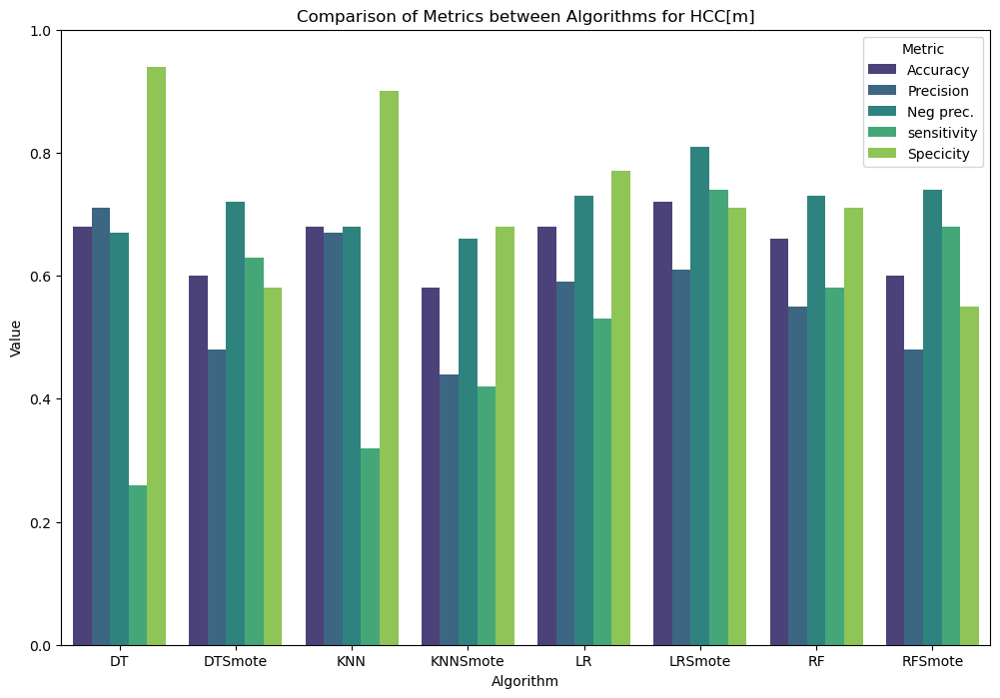

In [256]:
# Defina as métricas para cada algoritmo

metric = {
    'DT': {'Accuracy': 0.68, 'Precision': 0.71, 'Neg prec.': 0.67, 'sensitivity': 0.26, 'Specicity':0.94},
    'DTSmote':{'Accuracy': 0.6, 'Precision': 0.48, 'Neg prec.': 0.72, 'sensitivity': 0.63, 'Specicity':0.58},
    'KNN': {'Accuracy': 0.68, 'Precision': 0.67, 'Neg prec.': 0.68, 'sensitivity': 0.32, 'Specicity':0.90},
    'KNNSmote':{'Accuracy': 0.58, 'Precision': 0.44, 'Neg prec.': 0.66, 'sensitivity': 0.42, 'Specicity':0.68},
    'LR': {'Accuracy': 0.68, 'Precision': 0.59, 'Neg prec.': 0.73, 'sensitivity': 0.53, 'Specicity':0.77},
    'LRSmote':{'Accuracy': 0.72, 'Precision': 0.61, 'Neg prec.': 0.81, 'sensitivity': 0.74, 'Specicity':0.71},
    'RF': {'Accuracy': 0.66, 'Precision': 0.55, 'Neg prec.': 0.73, 'sensitivity': 0.58, 'Specicity':0.71},
    'RFSmote': {'Accuracy': 0.6, 'Precision': 0.48, 'Neg prec.': 0.74, 'sensitivity': 0.68, 'Specicity':0.55},
}
# Crie um DataFrame a partir do dicionário de métricas
df_metrics = pd.DataFrame(metric).T.reset_index().rename(columns={'index': 'Algorithm'})

# Melt do DataFrame para a visualização
df_metrics_melted = pd.melt(df_metrics, id_vars=['Algorithm'], var_name='Metric', value_name='Value')

# Crie o gráfico de barras utilizando Seaborn ou Matplotlib
plt.figure(figsize=(12, 8))
sns.barplot(x='Algorithm', y='Value', hue='Metric', data=df_metrics_melted, palette='viridis')
plt.title('Comparison of Metrics between Algorithms for HCC[m]')
plt.xlabel('Algorithm')
plt.ylabel('Value')
plt.ylim(0, 1)  # Ajuste os limites do eixo y conforme necessário
plt.legend(title='Metric')
plt.show()


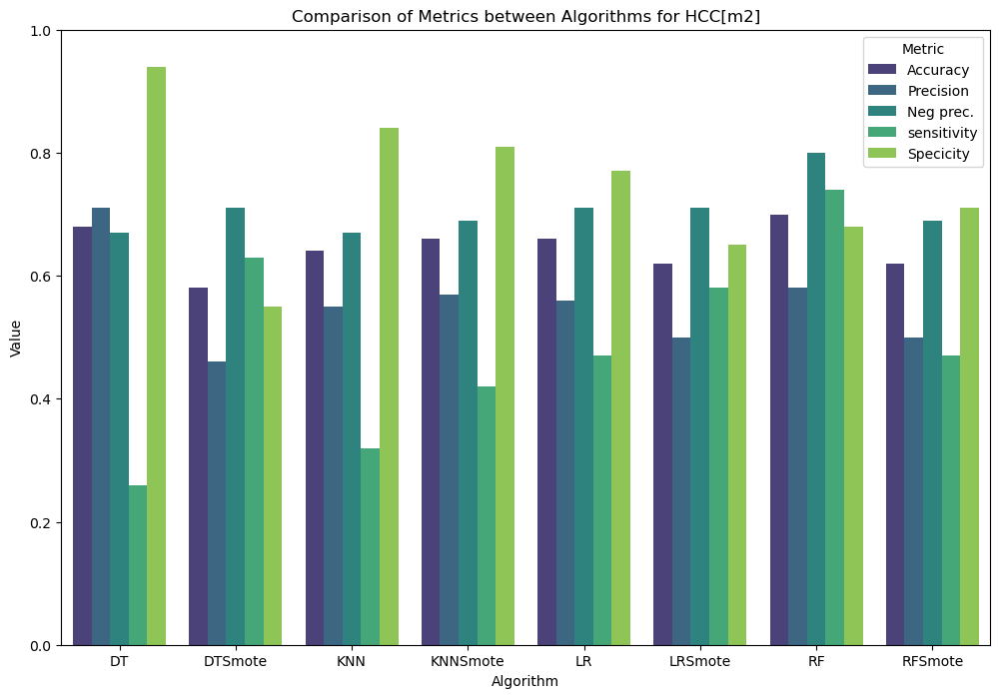

In [250]:
# Defina as métricas para cada algoritmo
metric = {
    'DT': {'Accuracy': 0.68, 'Precision': 0.71, 'Neg prec.': 0.67, 'sensitivity': 0.26, 'Specicity':0.94},
    'DTSmote':{'Accuracy': 0.58, 'Precision': 0.46, 'Neg prec.': 0.71, 'sensitivity': 0.63, 'Specicity':0.55},
    'KNN': {'Accuracy': 0.64, 'Precision': 0.55, 'Neg prec.': 0.67, 'sensitivity': 0.32, 'Specicity':0.84},
    'KNNSmote':{'Accuracy': 0.66, 'Precision': 0.57, 'Neg prec.': 0.69, 'sensitivity': 0.42, 'Specicity':0.81},
    'LR': {'Accuracy': 0.66, 'Precision': 0.56, 'Neg prec.': 0.71, 'sensitivity': 0.47, 'Specicity':0.77},
    'LRSmote':{'Accuracy': 0.62, 'Precision': 0.5, 'Neg prec.': 0.71, 'sensitivity': 0.58, 'Specicity':0.65},
    'RF': {'Accuracy': 0.7, 'Precision': 0.58, 'Neg prec.': 0.80, 'sensitivity': 0.74, 'Specicity':0.68},
    'RFSmote': {'Accuracy': 0.62, 'Precision': 0.5, 'Neg prec.': 0.69, 'sensitivity': 0.47, 'Specicity':0.71},
}
# Crie um DataFrame a partir do dicionário de métricas
df_metrics = pd.DataFrame(metric).T.reset_index().rename(columns={'index': 'Algorithm'})

# Melt do DataFrame para a visualização
df_metrics_melted = pd.melt(df_metrics, id_vars=['Algorithm'], var_name='Metric', value_name='Value')

# Crie o gráfico de barras utilizando Seaborn ou Matplotlib
plt.figure(figsize=(12, 8))
sns.barplot(x='Algorithm', y='Value', hue='Metric', data=df_metrics_melted, palette='viridis')
plt.title('Comparison of Metrics between Algorithms for HCC[m2]')
plt.xlabel('Algorithm')
plt.ylabel('Value')
plt.ylim(0, 1)  # Ajuste os limites do eixo y conforme necessário
plt.legend(title='Metric')
plt.show()

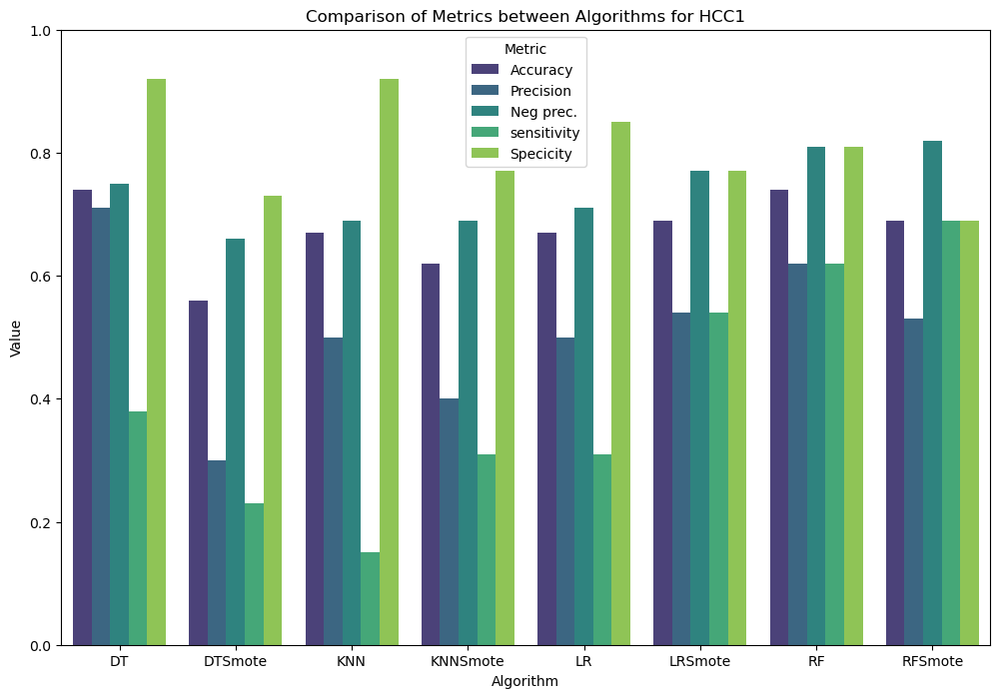

In [257]:
# Defina as métricas para cada algoritmo
metric = {
    'DT': {'Accuracy': 0.74, 'Precision': 0.71, 'Neg prec.': 0.75, 'sensitivity': 0.38, 'Specicity':0.92},
    'DTSmote':{'Accuracy': 0.56, 'Precision': 0.3, 'Neg prec.': 0.66, 'sensitivity': 0.23, 'Specicity':0.73},
    'KNN': {'Accuracy': 0.67, 'Precision': 0.5, 'Neg prec.': 0.69, 'sensitivity': 0.15, 'Specicity':0.92},
    'KNNSmote':{'Accuracy': 0.62, 'Precision': 0.4, 'Neg prec.': 0.69, 'sensitivity': 0.31, 'Specicity':0.77},
    'LR': {'Accuracy': 0.67, 'Precision': 0.5, 'Neg prec.': 0.71, 'sensitivity': 0.31, 'Specicity':0.85},
    'LRSmote':{'Accuracy': 0.69, 'Precision': 0.54, 'Neg prec.': 0.77, 'sensitivity': 0.54, 'Specicity':0.77},
    'RF': {'Accuracy': 0.74, 'Precision': 0.62, 'Neg prec.': 0.81, 'sensitivity': 0.62, 'Specicity':0.81},
    'RFSmote': {'Accuracy': 0.69, 'Precision': 0.53, 'Neg prec.': 0.82, 'sensitivity': 0.69, 'Specicity':0.69},
}

# Crie um DataFrame a partir do dicionário de métricas
df_metrics = pd.DataFrame(metric).T.reset_index().rename(columns={'index': 'Algorithm'})

# Melt do DataFrame para a visualização
df_metrics_melted = pd.melt(df_metrics, id_vars=['Algorithm'], var_name='Metric', value_name='Value')

# Crie o gráfico de barras utilizando Seaborn ou Matplotlib
plt.figure(figsize=(12, 8))
sns.barplot(x='Algorithm', y='Value', hue='Metric', data=df_metrics_melted, palette='viridis')
plt.title('Comparison of Metrics between Algorithms for HCC1')
plt.xlabel('Algorithm')
plt.ylabel('Value')
plt.ylim(0, 1)  # Ajuste os limites do eixo y conforme necessário
plt.legend(title='Metric')
plt.show()

In [268]:
from sklearn.metrics import roc_auc_score
logistic_classifier.fit(X0_train_SMOTE,y0_train_SMOTE)
y0_prob = logistic_classifier.predict_proba(X0_test)[:,1] # This will give you positive class prediction probabilities  
y0_pred = np.where(y0_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
logistic_classifier.score(X0_test, y0_pred)
auc_roc=roc_auc_score(y0_test,y0_pred)
auc_roc

0.7071307300509337

In [269]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y0_test, y0_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.7555178268251274

Text(0.5, 0, 'False Positive Rate')

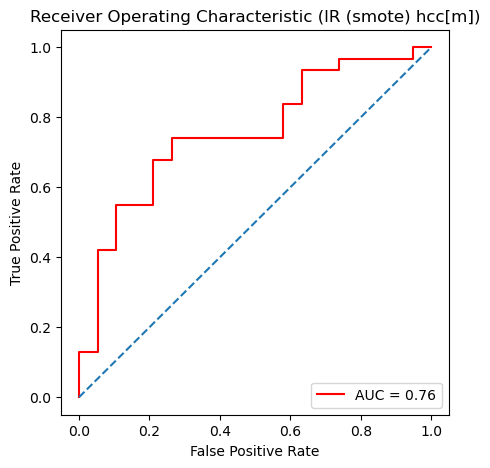

In [270]:
import matplotlib.pyplot as plt
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic (lR (smote) hcc[m])')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

In [271]:
from sklearn.metrics import roc_auc_score
RF_model.fit(X_train_SMOTE,y_train_SMOTE)
y_prob = RF_model.predict_proba(X_test)[:,1] # This will give you positive class prediction probabilities  
y_pred = np.where(y_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
RF_model.score(X_test, y_pred)
auc_roc=roc_auc_score(y_test,y_pred)
auc_roc

0.6544991511035653

In [272]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.7478777589134126

Text(0.5, 0, 'False Positive Rate')

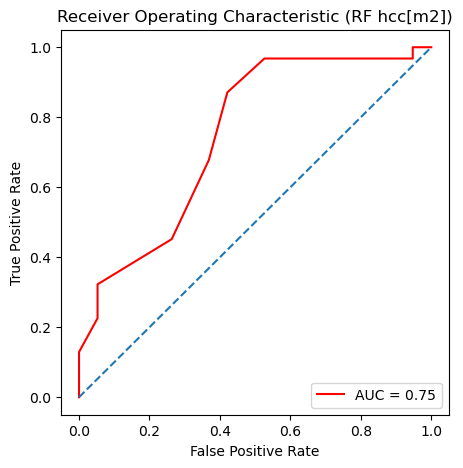

In [273]:
import matplotlib.pyplot as plt
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic (RF hcc[m2])')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

In [274]:
from sklearn.metrics import roc_auc_score
dt.fit(X2_train_SMOTE,y2_train_SMOTE)
y2_prob = dt.predict_proba(X2_test)[:,1] # This will give you positive class prediction probabilities  
y2_pred = np.where(y2_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
dt.score(X2_test, y2_pred)
auc_roc=roc_auc_score(y2_test,y2_pred)
auc_roc

0.5384615384615385

In [275]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y2_test, y2_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.6183431952662722

Text(0.5, 0, 'False Positive Rate')

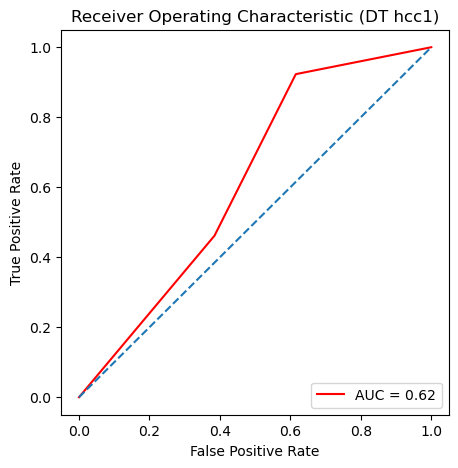

In [276]:
import matplotlib.pyplot as plt
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic (DT hcc1)')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')